In [105]:
# importing libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import VotingClassifier

from tensorflow.keras.utils import to_categorical

import folium
from folium.plugins import HeatMap
import plotly.express as px

plt.style.use('fivethirtyeight')
%matplotlib inline
pd.set_option('display.max_columns', 32)

In [2]:
DirPath = "/Users/oozdal/Documents/GitHub/Dive-Into-Deep-Learning/Hotel_booking/"
df = pd.read_csv(DirPath + 'hotel_bookings.csv', header=0, sep=",")
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [3]:
df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [5]:
# checking for null values 
null = pd.DataFrame({'Null Values' : df.isna().sum(), 'Percentage Null Values' : (df.isna().sum()) / (df.shape[0]) * (100)})
null

,Null Values,Percentage Null Values
hotel,0,0.000000
is_canceled,0,0.000000
lead_time,0,0.000000
arrival_date_year,0,0.000000
arrival_date_month,0,0.000000
arrival_date_week_number,0,0.000000
arrival_date_day_of_month,0,0.000000
stays_in_weekend_nights,0,0.000000
stays_in_week_nights,0,0.000000
adults,0,0.000000


In [6]:
# filling null values with zero
df.fillna(0, inplace = True)

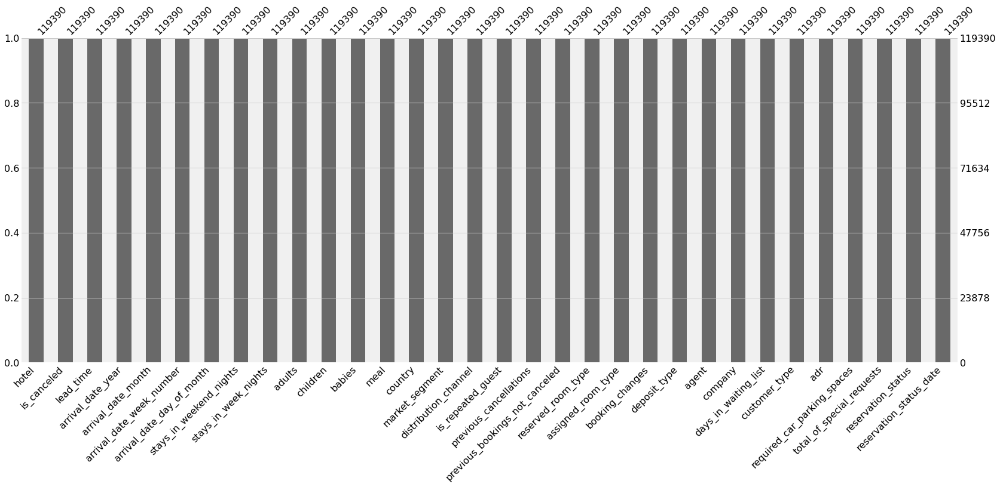

In [7]:
# visualizing null values
msno.bar(df)
plt.show()

In [8]:
# adults, babies and children cant be zero at same time, so dropping the rows having all these zero at same time
filter = (df.children == 0) & (df.adults == 0) & (df.babies == 0)
df[filter]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
2224,Resort Hotel,0,1,2015,October,41,6,0,3,0,0.0,0,SC,PRT,Corporate,Corporate,0,0,0,A,I,1,No Deposit,0.0,174.0,0,Transient-Party,0.00,0,0,Check-Out,2015-10-06
2409,Resort Hotel,0,0,2015,October,42,12,0,0,0,0.0,0,SC,PRT,Corporate,Corporate,0,0,0,A,I,0,No Deposit,0.0,174.0,0,Transient,0.00,0,0,Check-Out,2015-10-12
3181,Resort Hotel,0,36,2015,November,47,20,1,2,0,0.0,0,SC,ESP,Groups,TA/TO,0,0,0,A,C,0,No Deposit,38.0,0.0,0,Transient-Party,0.00,0,0,Check-Out,2015-11-23
3684,Resort Hotel,0,165,2015,December,53,30,1,4,0,0.0,0,SC,PRT,Groups,TA/TO,0,0,0,A,A,1,No Deposit,308.0,0.0,122,Transient-Party,0.00,0,0,Check-Out,2016-01-04
3708,Resort Hotel,0,165,2015,December,53,30,2,4,0,0.0,0,SC,PRT,Groups,TA/TO,0,0,0,A,C,1,No Deposit,308.0,0.0,122,Transient-Party,0.00,0,0,Check-Out,2016-01-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115029,City Hotel,0,107,2017,June,26,27,0,3,0,0.0,0,BB,CHE,Online TA,TA/TO,0,0,0,A,A,1,No Deposit,7.0,0.0,0,Transient,100.80,0,0,Check-Out,2017-06-30
115091,City Hotel,0,1,2017,June,26,30,0,1,0,0.0,0,SC,PRT,Complementary,Direct,0,0,0,E,K,0,No Deposit,0.0,0.0,0,Transient,0.00,1,1,Check-Out,2017-07-01
116251,City Hotel,0,44,2017,July,28,15,1,1,0,0.0,0,SC,SWE,Online TA,TA/TO,0,0,0,A,K,2,No Deposit,425.0,0.0,0,Transient,73.80,0,0,Check-Out,2017-07-17
116534,City Hotel,0,2,2017,July,28,15,2,5,0,0.0,0,SC,RUS,Online TA,TA/TO,0,0,0,A,K,1,No Deposit,9.0,0.0,0,Transient-Party,22.86,0,1,Check-Out,2017-07-22


In [9]:
df = df[~filter]
df

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0.0,0.0,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0.0,0.0,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0.0,0.0,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0.0,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0.0,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,0.0,0,Transient,96.14,0,0,Check-Out,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,0.0,0,Transient,225.43,0,2,Check-Out,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,0.0,0,Transient,157.71,0,4,Check-Out,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,0.0,0,Transient,104.40,0,0,Check-Out,2017-09-07


# Exploratory Data Analysis (EDA)
# From where the most guests are coming ?

In [10]:
country_wise_guests = df[df['is_canceled'] == 0]['country'].value_counts().reset_index()
country_wise_guests.columns = ['country', 'No of guests']
country_wise_guests

,country,No of guests
0,PRT,20977
1,GBR,9668
2,FRA,8468
3,ESP,6383
4,DEU,6067
...,...,...
161,LCA,1
162,SYC,1
163,KIR,1
164,SLE,1


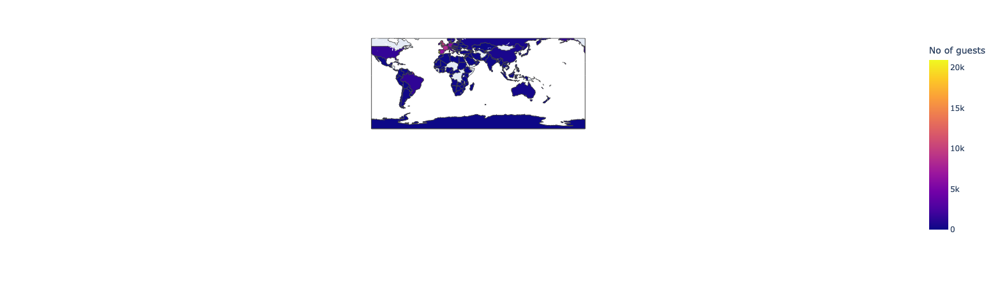

In [11]:
basemap = folium.Map()
guests_map = px.choropleth(country_wise_guests, locations = country_wise_guests['country'],
                           color = country_wise_guests['No of guests'], hover_name = country_wise_guests['country'])
guests_map.show()

# How much do guests pay for a room per night?

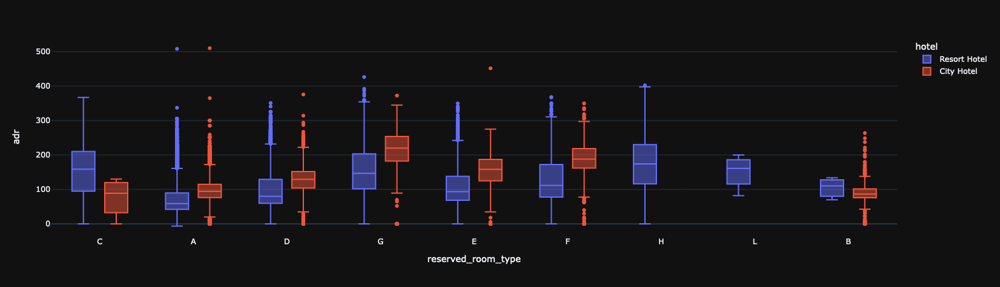

In [11]:
data = df[df['is_canceled'] == 0]
px.box(data_frame = data, x = 'reserved_room_type', y = 'adr', color = 'hotel', template = 'plotly_dark')

# How does the price vary per night over the year?

In [12]:
data_resort = df[(df['hotel'] == 'Resort Hotel') & (df['is_canceled'] == 0)]
data_city = df[(df['hotel'] == 'City Hotel') & (df['is_canceled'] == 0)]

In [13]:
resort_hotel = data_resort.groupby(['arrival_date_month'])['adr'].mean().reset_index()
resort_hotel

,arrival_date_month,adr
0,April,75.867816
1,August,181.205892
2,December,68.410104
3,February,54.147478
4,January,48.761125
5,July,150.122528
6,June,107.974850
7,March,57.056838
8,May,76.657558
9,November,48.706289


In [14]:
city_hotel=data_city.groupby(['arrival_date_month'])['adr'].mean().reset_index()
city_hotel

,arrival_date_month,adr
0,April,111.962267
1,August,118.674598
2,December,88.401855
3,February,86.520062
4,January,82.330983
5,July,115.818019
6,June,117.874360
7,March,90.658533
8,May,120.669827
9,November,86.946592


In [15]:
final_hotel = resort_hotel.merge(city_hotel, on = 'arrival_date_month')
final_hotel.columns = ['month', 'price_for_resort', 'price_for_city_hotel']
final_hotel

,month,price_for_resort,price_for_city_hotel
0,April,75.867816,111.962267
1,August,181.205892,118.674598
2,December,68.410104,88.401855
3,February,54.147478,86.520062
4,January,48.761125,82.330983
5,July,150.122528,115.818019
6,June,107.974850,117.874360
7,March,57.056838,90.658533
8,May,76.657558,120.669827
9,November,48.706289,86.946592


# Now we observe here that month column is not in order, and if we visualize we will get improper conclusions.
# So, first we have to provide right hierarchy to month column.

In [16]:
import sort_dataframeby_monthorweek as sd

def sort_month(df, column_name):
    return sd.Sort_Dataframeby_Month(df, column_name)

In [17]:
final_prices = sort_month(final_hotel, 'month')
final_prices

,month,price_for_resort,price_for_city_hotel
0,January,48.761125,82.330983
1,February,54.147478,86.520062
2,March,57.056838,90.658533
3,April,75.867816,111.962267
4,May,76.657558,120.669827
5,June,107.974850,117.874360
6,July,150.122528,115.818019
7,August,181.205892,118.674598
8,September,96.416860,112.776582
9,October,61.775449,102.004672


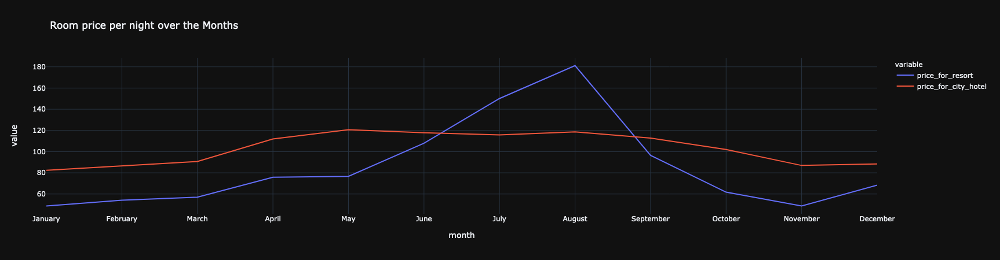

<Figure size 1224x576 with 0 Axes>

In [18]:
plt.figure(figsize = (17, 8))

px.line(final_prices, x = 'month', y = ['price_for_resort','price_for_city_hotel'],
        title = 'Room price per night over the Months', template = 'plotly_dark')

# Which are the most busy months?

In [20]:
resort_guests = data_resort['arrival_date_month'].value_counts().reset_index()
resort_guests.columns=['month','no of guests']
resort_guests

,month,no of guests
0,August,3257
1,July,3137
2,October,2575
3,March,2571
4,April,2550
5,May,2535
6,February,2308
7,September,2102
8,June,2037
9,December,2014


In [24]:
city_guests = data_city['arrival_date_month'].value_counts().reset_index()
city_guests.columns=['month','no of guests']
city_guests

,month,no of guests
0,August,5367
1,July,4770
2,May,4568
3,June,4358
4,October,4326
5,September,4283
6,March,4049
7,April,4010
8,February,3051
9,November,2676


In [25]:
final_guests = resort_guests.merge(city_guests,on='month')
final_guests.columns=['month','no of guests in resort','no of guest in city hotel']
final_guests

,month,no of guests in resort,no of guest in city hotel
0,August,3257,5367
1,July,3137,4770
2,October,2575,4326
3,March,2571,4049
4,April,2550,4010
5,May,2535,4568
6,February,2308,3051
7,September,2102,4283
8,June,2037,4358
9,December,2014,2377


In [26]:
final_guests = sort_month(final_guests,'month')
final_guests

,month,no of guests in resort,no of guest in city hotel
0,January,1866,2249
1,February,2308,3051
2,March,2571,4049
3,April,2550,4010
4,May,2535,4568
5,June,2037,4358
6,July,3137,4770
7,August,3257,5367
8,September,2102,4283
9,October,2575,4326


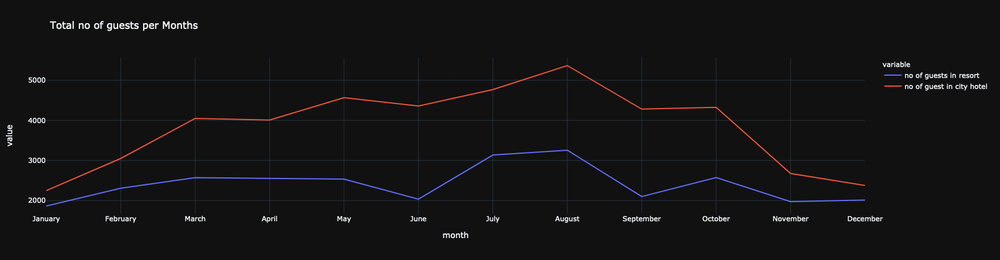

In [27]:
px.line(final_guests, x = 'month', y = ['no of guests in resort','no of guest in city hotel'],
        title='Total no of guests per Months', template = 'plotly_dark')

$\bullet$ The City hotel has more guests during spring and autumn, when the prices are also highest, In July and August there are less visitors, although prices are lower.

$\bullet$ Guest numbers for the Resort hotel go down slighty from June to September, which is also when the prices are highest. Both hotels have the fewest guests during the winter.

# How long do people stay at the hotels?

In [28]:
filter = df['is_canceled'] == 0
data = df[filter]
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,0.0,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0.0,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [29]:
data['total_nights'] = data['stays_in_weekend_nights'] + data['stays_in_week_nights']
data.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,...,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,total_nights
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,...,0,0,C,C,3,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,...,0,0,C,C,4,No Deposit,0.0,0.0,0,Transient,0.0,0,0,Check-Out,2015-07-01,0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,...,0,0,A,C,0,No Deposit,0.0,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02,1
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,...,0,0,A,A,0,No Deposit,304.0,0.0,0,Transient,75.0,0,0,Check-Out,2015-07-02,1
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,...,0,0,A,A,0,No Deposit,240.0,0.0,0,Transient,98.0,0,1,Check-Out,2015-07-03,2


In [45]:
stay = data.groupby(['total_nights', 'hotel']).count().reset_index()
stay = stay.iloc[:, :3]
stay = stay.rename(columns={'is_canceled':'Number of stays'})
stay

,total_nights,hotel,Number of stays
0,0,City Hotel,251
1,0,Resort Hotel,371
2,1,City Hotel,9155
3,1,Resort Hotel,6579
4,2,City Hotel,10983
...,...,...,...
57,46,Resort Hotel,1
58,48,City Hotel,1
59,56,Resort Hotel,1
60,60,Resort Hotel,1


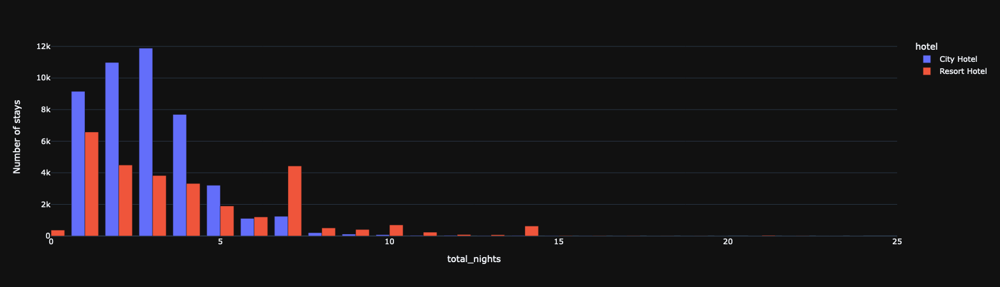

In [51]:
fig = px.bar(data_frame = stay, x = 'total_nights', y = 'Number of stays', color = 'hotel', barmode = 'group',
        template = 'plotly_dark')
fig.update_xaxes(range = [0,25])

# Data Pre Processing

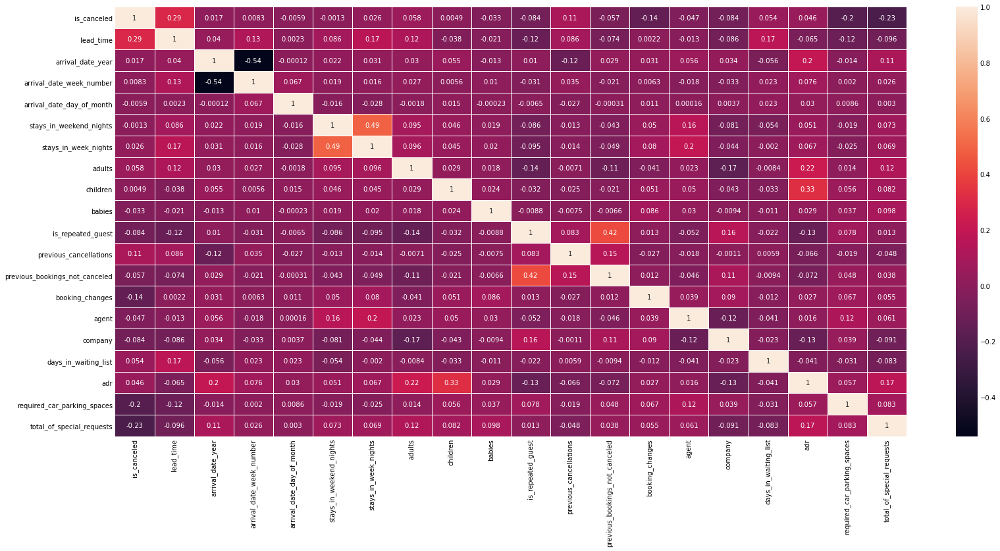

In [52]:
plt.figure(figsize = (24, 12))
corr = df.corr()
sns.heatmap(corr, annot = True, linewidths = 1)
plt.show()

In [58]:
correlation = df.corr()['is_canceled'].abs().sort_values(ascending = False)
correlation

is_canceled                       1.000000
lead_time                         0.292876
total_of_special_requests         0.234877
required_car_parking_spaces       0.195701
booking_changes                   0.144832
previous_cancellations            0.110139
is_repeated_guest                 0.083745
company                           0.083594
adults                            0.058182
previous_bookings_not_canceled    0.057365
days_in_waiting_list              0.054301
agent                             0.046770
adr                               0.046492
babies                            0.032569
stays_in_week_nights              0.025542
arrival_date_year                 0.016622
arrival_date_week_number          0.008315
arrival_date_day_of_month         0.005948
children                          0.004851
stays_in_weekend_nights           0.001323
Name: is_canceled, dtype: float64

In [59]:
# dropping columns that are not useful
useless_col = ['days_in_waiting_list', 'arrival_date_year', 'arrival_date_year', 'assigned_room_type', 'booking_changes',
               'reservation_status', 'country', 'days_in_waiting_list']
df.drop(useless_col, axis = 1, inplace = True)
df.head()

,hotel,is_canceled,lead_time,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,deposit_type,agent,company,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status_date
0,Resort Hotel,0,342,July,27,1,0,0,2,0.0,0,BB,Direct,Direct,0,0,0,C,No Deposit,0.0,0.0,Transient,0.0,0,0,2015-07-01
1,Resort Hotel,0,737,July,27,1,0,0,2,0.0,0,BB,Direct,Direct,0,0,0,C,No Deposit,0.0,0.0,Transient,0.0,0,0,2015-07-01
2,Resort Hotel,0,7,July,27,1,0,1,1,0.0,0,BB,Direct,Direct,0,0,0,A,No Deposit,0.0,0.0,Transient,75.0,0,0,2015-07-02
3,Resort Hotel,0,13,July,27,1,0,1,1,0.0,0,BB,Corporate,Corporate,0,0,0,A,No Deposit,304.0,0.0,Transient,75.0,0,0,2015-07-02
4,Resort Hotel,0,14,July,27,1,0,2,2,0.0,0,BB,Online TA,TA/TO,0,0,0,A,No Deposit,240.0,0.0,Transient,98.0,0,1,2015-07-03


In [60]:
# creating numerical and categorical dataframes
cat_cols = [col for col in df.columns if df[col].dtype == 'O']
cat_cols

['hotel',
 'arrival_date_month',
 'meal',
 'market_segment',
 'distribution_channel',
 'reserved_room_type',
 'deposit_type',
 'customer_type',
 'reservation_status_date']

In [61]:
cat_df = df[cat_cols]
cat_df.head()

,hotel,arrival_date_month,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,reservation_status_date
0,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,2015-07-01
1,Resort Hotel,July,BB,Direct,Direct,C,No Deposit,Transient,2015-07-01
2,Resort Hotel,July,BB,Direct,Direct,A,No Deposit,Transient,2015-07-02
3,Resort Hotel,July,BB,Corporate,Corporate,A,No Deposit,Transient,2015-07-02
4,Resort Hotel,July,BB,Online TA,TA/TO,A,No Deposit,Transient,2015-07-03


In [62]:
cat_df['reservation_status_date'] = pd.to_datetime(cat_df['reservation_status_date'])

cat_df['year'] = cat_df['reservation_status_date'].dt.year
cat_df['month'] = cat_df['reservation_status_date'].dt.month
cat_df['day'] = cat_df['reservation_status_date'].dt.day

In [72]:
cat_df.drop(['reservation_status_date','arrival_date_month'], axis = 1, inplace = True)
cat_df.head()

,hotel,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day
0,Resort Hotel,BB,Direct,Direct,C,No Deposit,Transient,2015,7,1
1,Resort Hotel,BB,Direct,Direct,C,No Deposit,Transient,2015,7,1
2,Resort Hotel,BB,Direct,Direct,A,No Deposit,Transient,2015,7,2
3,Resort Hotel,BB,Corporate,Corporate,A,No Deposit,Transient,2015,7,2
4,Resort Hotel,BB,Online TA,TA/TO,A,No Deposit,Transient,2015,7,3


In [73]:
# printing unique values of each column
for col in cat_df.columns:
    print(f"{col}: \n{cat_df[col].unique()}\n")

hotel: 
['Resort Hotel' 'City Hotel']

meal: 
['BB' 'FB' 'HB' 'SC' 'Undefined']

market_segment: 
['Direct' 'Corporate' 'Online TA' 'Offline TA/TO' 'Complementary' 'Groups'
 'Undefined' 'Aviation']

distribution_channel: 
['Direct' 'Corporate' 'TA/TO' 'Undefined' 'GDS']

reserved_room_type: 
['C' 'A' 'D' 'E' 'G' 'F' 'H' 'L' 'B']

deposit_type: 
['No Deposit' 'Refundable' 'Non Refund']

customer_type: 
['Transient' 'Contract' 'Transient-Party' 'Group']

year: 
[2015 2014 2016 2017]

month: 
[ 7  5  4  6  3  8  9  1 11 10 12  2]

day: 
[ 1  2  3  6 22 23  5  7  8 11 15 16 29 19 18  9 13  4 12 26 17 10 20 14
 30 28 25 21 27 24 31]



In [74]:
# encoding categorical variables

cat_df['hotel'] = cat_df['hotel'].map({'Resort Hotel' : 0, 'City Hotel' : 1})

cat_df['meal'] = cat_df['meal'].map({'BB' : 0, 'FB': 1, 'HB': 2, 'SC': 3, 'Undefined': 4})

cat_df['market_segment'] = cat_df['market_segment'].map({'Direct': 0, 'Corporate': 1, 'Online TA': 2, 'Offline TA/TO': 3,
                                                           'Complementary': 4, 'Groups': 5, 'Undefined': 6, 'Aviation': 7})

cat_df['distribution_channel'] = cat_df['distribution_channel'].map({'Direct': 0, 'Corporate': 1, 'TA/TO': 2, 'Undefined': 3,
                                                                       'GDS': 4})

cat_df['reserved_room_type'] = cat_df['reserved_room_type'].map({'C': 0, 'A': 1, 'D': 2, 'E': 3, 'G': 4, 'F': 5, 'H': 6,
                                                                   'L': 7, 'B': 8})

cat_df['deposit_type'] = cat_df['deposit_type'].map({'No Deposit': 0, 'Refundable': 1, 'Non Refund': 3})

cat_df['customer_type'] = cat_df['customer_type'].map({'Transient': 0, 'Contract': 1, 'Transient-Party': 2, 'Group': 3})

cat_df['year'] = cat_df['year'].map({2015: 0, 2014: 1, 2016: 2, 2017: 3})

In [75]:
cat_df.head()

,hotel,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day
0,0,0,0,0,0,0,0,0,7,1
1,0,0,0,0,0,0,0,0,7,1
2,0,0,0,0,1,0,0,0,7,2
3,0,0,1,1,1,0,0,0,7,2
4,0,0,2,2,1,0,0,0,7,3


In [76]:
num_df = df.drop(columns = cat_cols, axis = 1)
num_df.drop('is_canceled', axis = 1, inplace = True)
num_df

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,agent,company,adr,required_car_parking_spaces,total_of_special_requests
0,342,27,1,0,0,2,0.0,0,0,0,0,0.0,0.0,0.00,0,0
1,737,27,1,0,0,2,0.0,0,0,0,0,0.0,0.0,0.00,0,0
2,7,27,1,0,1,1,0.0,0,0,0,0,0.0,0.0,75.00,0,0
3,13,27,1,0,1,1,0.0,0,0,0,0,304.0,0.0,75.00,0,0
4,14,27,1,0,2,2,0.0,0,0,0,0,240.0,0.0,98.00,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,23,35,30,2,5,2,0.0,0,0,0,0,394.0,0.0,96.14,0,0
119386,102,35,31,2,5,3,0.0,0,0,0,0,9.0,0.0,225.43,0,2
119387,34,35,31,2,5,2,0.0,0,0,0,0,9.0,0.0,157.71,0,4
119388,109,35,31,2,5,2,0.0,0,0,0,0,89.0,0.0,104.40,0,0


In [77]:
num_df.var()

lead_time                         11422.361808
arrival_date_week_number            184.990111
arrival_date_day_of_month            77.107192
stays_in_weekend_nights               0.990258
stays_in_week_nights                  3.599010
adults                                0.330838
children                              0.159070
babies                                0.009508
is_repeated_guest                     0.030507
previous_cancellations                0.713887
previous_bookings_not_canceled        2.244415
agent                             11485.169679
company                            2897.684308
adr                                2543.589039
required_car_parking_spaces           0.060201
total_of_special_requests             0.628652
dtype: float64

In [78]:
# normalizing numerical variables

num_df['lead_time'] = np.log(num_df['lead_time'] + 1)
num_df['arrival_date_week_number'] = np.log(num_df['arrival_date_week_number'] + 1)
num_df['arrival_date_day_of_month'] = np.log(num_df['arrival_date_day_of_month'] + 1)
num_df['agent'] = np.log(num_df['agent'] + 1)
num_df['company'] = np.log(num_df['company'] + 1)
num_df['adr'] = np.log(num_df['adr'] + 1)

In [79]:
num_df.var()

lead_time                         2.582757
arrival_date_week_number          0.440884
arrival_date_day_of_month         0.506325
stays_in_weekend_nights           0.990258
stays_in_week_nights              3.599010
adults                            0.330838
children                          0.159070
babies                            0.009508
is_repeated_guest                 0.030507
previous_cancellations            0.713887
previous_bookings_not_canceled    2.244415
agent                             3.535793
company                           1.346883
adr                               0.515480
required_car_parking_spaces       0.060201
total_of_special_requests         0.628652
dtype: float64

In [80]:
num_df['adr'] = num_df['adr'].fillna(value = num_df['adr'].mean())

In [81]:
num_df.head()

,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,agent,company,adr,required_car_parking_spaces,total_of_special_requests
0,5.837730,3.332205,0.693147,0,0,2,0.0,0,0,0,0,0.000000,0.0,0.000000,0,0
1,6.603944,3.332205,0.693147,0,0,2,0.0,0,0,0,0,0.000000,0.0,0.000000,0,0
2,2.079442,3.332205,0.693147,0,1,1,0.0,0,0,0,0,0.000000,0.0,4.330733,0,0
3,2.639057,3.332205,0.693147,0,1,1,0.0,0,0,0,0,5.720312,0.0,4.330733,0,0
4,2.708050,3.332205,0.693147,0,2,2,0.0,0,0,0,0,5.484797,0.0,4.595120,0,1


In [82]:
X = pd.concat([cat_df, num_df], axis = 1)
y = df['is_canceled']

In [83]:
X.shape, y.shape

((119210, 26), (119210,))

In [84]:
# splitting data into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30)

In [85]:
X_train.head()

,hotel,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,agent,company,adr,required_car_parking_spaces,total_of_special_requests
34139,0,0,5,2,3,0,2,3,3,14,4.727388,2.484907,2.639057,1,0,2,0.0,0,0,0,0,4.204693,0.000000,3.931826,0,0
21656,0,0,0,0,1,0,0,2,3,6,3.931826,2.397895,1.609438,0,2,2,0.0,0,0,0,0,0.000000,0.000000,4.043051,0,1
23168,0,2,5,0,2,0,2,2,4,17,4.477337,2.833213,2.397895,2,5,2,0.0,0,0,0,1,5.613128,0.000000,3.616846,0,0
85809,1,0,7,2,1,0,0,2,3,22,2.079442,2.639057,3.091042,1,0,1,0.0,0,0,0,0,0.000000,5.036953,4.488636,1,0
15198,0,0,3,2,1,3,0,0,6,17,5.564520,3.663562,2.995732,2,5,2,0.0,0,0,1,0,4.574711,0.000000,4.025173,0,0


In [86]:
X_test.head()

,hotel,meal,market_segment,distribution_channel,reserved_room_type,deposit_type,customer_type,year,month,day,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,agent,company,adr,required_car_parking_spaces,total_of_special_requests
46399,1,0,2,2,2,0,0,2,1,2,1.945910,3.988984,3.465736,0,2,2,0.0,0,0,0,0,2.302585,0.0,4.927254,0,1
101622,1,3,2,2,1,0,0,2,11,15,4.770685,3.871201,2.639057,2,0,2,0.0,0,0,0,0,2.302585,0.0,4.384524,0,0
116682,1,3,2,2,1,0,0,3,7,24,2.833213,3.401197,3.091042,1,2,2,0.0,0,0,0,0,6.049733,0.0,4.647463,0,1
59590,1,0,2,2,1,0,0,2,10,5,5.220356,3.806662,3.401197,2,1,2,0.0,0,0,0,0,2.302585,0.0,4.520701,0,1
5946,0,0,5,2,1,3,0,2,1,25,5.023881,3.091042,2.890372,0,4,2,0.0,0,0,0,0,0.000000,0.0,3.850148,0,0


In [87]:
y_train.head(), y_test.head()

(34139    0
 21656    0
 23168    0
 85809    0
 15198    1
 Name: is_canceled, dtype: int64,
 46399     0
 101622    0
 116682    0
 59590     1
 5946      1
 Name: is_canceled, dtype: int64)

# Model Building
# Logistic Regression

In [91]:
lr = LogisticRegression()
lr.fit(X_train, y_train)

y_pred_lr = lr.predict(X_test)

acc_lr = accuracy_score(y_test, y_pred_lr)
conf = confusion_matrix(y_test, y_pred_lr)
clf_report = classification_report(y_test, y_pred_lr)

print(f"Accuracy Score of Logistic Regression is : {acc_lr}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Logistic Regression is : 0.8133545843469507
Confusion Matrix : 
[[21455  1152]
 [ 5523  7633]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.80      0.95      0.87     22607
           1       0.87      0.58      0.70     13156

    accuracy                           0.81     35763
   macro avg       0.83      0.76      0.78     35763
weighted avg       0.82      0.81      0.80     35763



# KNN

In [92]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

y_pred_knn = knn.predict(X_test)

acc_knn = accuracy_score(y_test, y_pred_knn)
conf = confusion_matrix(y_test, y_pred_knn)
clf_report = classification_report(y_test, y_pred_knn)

print(f"Accuracy Score of KNN is : {acc_knn}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of KNN is : 0.8936051226127562
Confusion Matrix : 
[[21818   789]
 [ 3016 10140]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.88      0.97      0.92     22607
           1       0.93      0.77      0.84     13156

    accuracy                           0.89     35763
   macro avg       0.90      0.87      0.88     35763
weighted avg       0.90      0.89      0.89     35763



# Decision Tree Classifier

In [93]:
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)

y_pred_dtc = dtc.predict(X_test)

acc_dtc = accuracy_score(y_test, y_pred_dtc)
conf = confusion_matrix(y_test, y_pred_dtc)
clf_report = classification_report(y_test, y_pred_dtc)

print(f"Accuracy Score of Decision Tree is : {acc_dtc}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Decision Tree is : 0.9413360176718956
Confusion Matrix : 
[[21576  1031]
 [ 1067 12089]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.95      0.95      0.95     22607
           1       0.92      0.92      0.92     13156

    accuracy                           0.94     35763
   macro avg       0.94      0.94      0.94     35763
weighted avg       0.94      0.94      0.94     35763



# Random Forest Classifier

In [94]:
rd_clf = RandomForestClassifier()
rd_clf.fit(X_train, y_train)

y_pred_rd_clf = rd_clf.predict(X_test)

acc_rd_clf = accuracy_score(y_test, y_pred_rd_clf)
conf = confusion_matrix(y_test, y_pred_rd_clf)
clf_report = classification_report(y_test, y_pred_rd_clf)

print(f"Accuracy Score of Random Forest is : {acc_rd_clf}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Random Forest is : 0.9539188546822135
Confusion Matrix : 
[[22434   173]
 [ 1475 11681]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.94      0.99      0.96     22607
           1       0.99      0.89      0.93     13156

    accuracy                           0.95     35763
   macro avg       0.96      0.94      0.95     35763
weighted avg       0.96      0.95      0.95     35763



# Ada Boost Classifier

In [95]:
ada = AdaBoostClassifier(base_estimator = dtc)
ada.fit(X_train, y_train)

y_pred_ada = ada.predict(X_test)

acc_ada = accuracy_score(y_test, y_pred_ada)
conf = confusion_matrix(y_test, y_pred_ada)
clf_report = classification_report(y_test, y_pred_ada)

print(f"Accuracy Score of Ada Boost Classifier is : {acc_ada}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Ada Boost Classifier is : 0.9413639795319184
Confusion Matrix : 
[[21580  1027]
 [ 1070 12086]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.95      0.95      0.95     22607
           1       0.92      0.92      0.92     13156

    accuracy                           0.94     35763
   macro avg       0.94      0.94      0.94     35763
weighted avg       0.94      0.94      0.94     35763



# Gradient Boosting Classifier

In [96]:
gb = GradientBoostingClassifier()
gb.fit(X_train, y_train)

y_pred_gb = gb.predict(X_test)

acc_gb = accuracy_score(y_test, y_pred_gb)
conf = confusion_matrix(y_test, y_pred_gb)
clf_report = classification_report(y_test, y_pred_gb)

print(f"Accuracy Score of Ada Boost Classifier is : {acc_gb}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Ada Boost Classifier is : 0.9162542292313285
Confusion Matrix : 
[[22439   168]
 [ 2827 10329]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.89      0.99      0.94     22607
           1       0.98      0.79      0.87     13156

    accuracy                           0.92     35763
   macro avg       0.94      0.89      0.91     35763
weighted avg       0.92      0.92      0.91     35763



# XgBoost Classifier

In [97]:
xgb = XGBClassifier(booster = 'gbtree', learning_rate = 0.1, max_depth = 5, n_estimators = 180)
xgb.fit(X_train, y_train)

y_pred_xgb = xgb.predict(X_test)

acc_xgb = accuracy_score(y_test, y_pred_xgb)
conf = confusion_matrix(y_test, y_pred_xgb)
clf_report = classification_report(y_test, y_pred_xgb)

print(f"Accuracy Score of Ada Boost Classifier is : {acc_xgb}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

[16:34:30] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy Score of Ada Boost Classifier is : 0.9829712272460364
Confusion Matrix : 
[[22600     7]
 [  602 12554]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.97      1.00      0.99     22607
           1       1.00      0.95      0.98     13156

    accuracy                           0.98     35763
   macro avg       0.99      0.98      0.98     35763
weighted avg       0.98      0.98      0.98     35763



# Cat Boost Classifier

In [98]:
cat = CatBoostClassifier(iterations=100)
cat.fit(X_train, y_train)

y_pred_cat = cat.predict(X_test)

acc_cat = accuracy_score(y_test, y_pred_cat)
conf = confusion_matrix(y_test, y_pred_cat)
clf_report = classification_report(y_test, y_pred_cat)

Learning rate set to 0.5
0:	learn: 0.4786965	total: 121ms	remaining: 11.9s
1:	learn: 0.4116590	total: 225ms	remaining: 11s
2:	learn: 0.3897470	total: 281ms	remaining: 9.08s
3:	learn: 0.3555246	total: 565ms	remaining: 13.6s
4:	learn: 0.3244396	total: 660ms	remaining: 12.5s
5:	learn: 0.2694286	total: 715ms	remaining: 11.2s
6:	learn: 0.2640797	total: 764ms	remaining: 10.2s
7:	learn: 0.2309713	total: 829ms	remaining: 9.54s
8:	learn: 0.2155099	total: 882ms	remaining: 8.91s
9:	learn: 0.1897864	total: 934ms	remaining: 8.41s
10:	learn: 0.1756299	total: 984ms	remaining: 7.96s
11:	learn: 0.1616841	total: 1.04s	remaining: 7.61s
12:	learn: 0.1581570	total: 1.1s	remaining: 7.34s
13:	learn: 0.1466038	total: 1.19s	remaining: 7.33s
14:	learn: 0.1352003	total: 1.35s	remaining: 7.64s
15:	learn: 0.1331473	total: 1.44s	remaining: 7.55s
16:	learn: 0.1271064	total: 1.52s	remaining: 7.41s
17:	learn: 0.1196391	total: 1.59s	remaining: 7.25s
18:	learn: 0.1143125	total: 1.64s	remaining: 7s
19:	learn: 0.1113512	t

In [99]:
print(f"Accuracy Score of Ada Boost Classifier is : {acc_cat}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Ada Boost Classifier is : 0.9955540642563543
Confusion Matrix : 
[[22599     8]
 [  151 13005]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.99      1.00      1.00     22607
           1       1.00      0.99      0.99     13156

    accuracy                           1.00     35763
   macro avg       1.00      0.99      1.00     35763
weighted avg       1.00      1.00      1.00     35763



# Extra Trees Classifier

In [100]:
etc = ExtraTreesClassifier()
etc.fit(X_train, y_train)

y_pred_etc = etc.predict(X_test)

acc_etc = accuracy_score(y_test, y_pred_etc)
conf = confusion_matrix(y_test, y_pred_etc)
clf_report = classification_report(y_test, y_pred_etc)

print(f"Accuracy Score of Ada Boost Classifier is : {acc_etc}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Ada Boost Classifier is : 0.9522411430808377
Confusion Matrix : 
[[22397   210]
 [ 1498 11658]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.94      0.99      0.96     22607
           1       0.98      0.89      0.93     13156

    accuracy                           0.95     35763
   macro avg       0.96      0.94      0.95     35763
weighted avg       0.95      0.95      0.95     35763



# LGBM Classifier

In [101]:
lgbm = LGBMClassifier(learning_rate = 1)
lgbm.fit(X_train, y_train)

y_pred_lgbm = lgbm.predict(X_test)

acc_lgbm = accuracy_score(y_test, y_pred_lgbm)
conf = confusion_matrix(y_test, y_pred_lgbm)
clf_report = classification_report(y_test, y_pred_lgbm)

print(f"Accuracy Score of Ada Boost Classifier is : {acc_lgbm}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Ada Boost Classifier is : 0.9610211671280373
Confusion Matrix : 
[[21966   641]
 [  753 12403]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.97      0.97      0.97     22607
           1       0.95      0.94      0.95     13156

    accuracy                           0.96     35763
   macro avg       0.96      0.96      0.96     35763
weighted avg       0.96      0.96      0.96     35763



# Voting Classifier

In [102]:
classifiers = [('Gradient Boosting Classifier', gb), ('Cat Boost Classifier', cat), ('XGboost', xgb),  ('Decision Tree', dtc),
               ('Extra Tree', etc), ('Light Gradient', lgbm), ('Random Forest', rd_clf), ('Ada Boost', ada), ('Logistic', lr),
               ('Knn', knn)]
vc = VotingClassifier(estimators = classifiers)
vc.fit(X_train, y_train)

Learning rate set to 0.5
0:	learn: 0.4786965	total: 51.5ms	remaining: 5.1s
1:	learn: 0.4116590	total: 98.1ms	remaining: 4.81s
2:	learn: 0.3897470	total: 146ms	remaining: 4.73s
3:	learn: 0.3555246	total: 196ms	remaining: 4.71s
4:	learn: 0.3244396	total: 251ms	remaining: 4.77s
5:	learn: 0.2694286	total: 322ms	remaining: 5.05s
6:	learn: 0.2640797	total: 368ms	remaining: 4.89s
7:	learn: 0.2309713	total: 420ms	remaining: 4.83s
8:	learn: 0.2155099	total: 465ms	remaining: 4.7s
9:	learn: 0.1897864	total: 511ms	remaining: 4.59s
10:	learn: 0.1756299	total: 554ms	remaining: 4.48s
11:	learn: 0.1616841	total: 600ms	remaining: 4.4s
12:	learn: 0.1581570	total: 650ms	remaining: 4.35s
13:	learn: 0.1466038	total: 697ms	remaining: 4.28s
14:	learn: 0.1352003	total: 743ms	remaining: 4.21s
15:	learn: 0.1331473	total: 787ms	remaining: 4.13s
16:	learn: 0.1271064	total: 830ms	remaining: 4.05s
17:	learn: 0.1196391	total: 880ms	remaining: 4.01s
18:	learn: 0.1143125	total: 924ms	remaining: 3.94s
19:	learn: 0.1113

VotingClassifier(estimators=[('Gradient Boosting Classifier',
                              GradientBoostingClassifier()),
                             ('Cat Boost Classifier',
                              <catboost.core.CatBoostClassifier object at 0x7f9b7793f190>),
                             ('XGboost',
                              XGBClassifier(base_score=0.5, booster='gbtree',
                                            colsample_bylevel=1,
                                            colsample_bynode=1,
                                            colsample_bytree=1, gamma=0,
                                            gpu_id=-1, importance_type='gain',
                                            interaction_constraints='...
                                            tree_method='exact',
                                            validate_parameters=1,
                                            verbosity=None)),
                             ('Decision Tree', DecisionTreeClass

In [103]:
y_pred_vc = vc.predict(X_test)

acc_vtc = accuracy_score(y_test, y_pred_vc)
conf = confusion_matrix(y_test, y_pred_vc)
clf_report = classification_report(y_test, y_pred_vc)

print(f"Accuracy Score of Ada Boost Classifier is : {acc_vtc}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{clf_report}")

Accuracy Score of Ada Boost Classifier is : 0.9634538489500322
Confusion Matrix : 
[[22597    10]
 [ 1297 11859]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.95      1.00      0.97     22607
           1       1.00      0.90      0.95     13156

    accuracy                           0.96     35763
   macro avg       0.97      0.95      0.96     35763
weighted avg       0.97      0.96      0.96     35763



# ANN

In [106]:
X = pd.concat([cat_df, num_df], axis = 1)
y = to_categorical(df['is_canceled'])

# splitting data into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30)

In [118]:
from tensorflow import keras 
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential

model  = Sequential()
model.add(Dense(100, activation = 'relu', input_shape = (26, )))
model.add(Dense(100, activation = 'relu'))
model.add(Dense(2, activation = 'sigmoid'))
model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
model_history = model.fit(X_train, y_train, validation_data = (X_test, y_test),
                          epochs = 100)

Epoch 1/100
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: closure mismatch, requested ('self', 'step_function'), but source function had ()
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
2608/2608 [==============================] - ETA: 0s - loss: 0.4368 - accuracy: 0.8058WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x7f9b16829ca0> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set

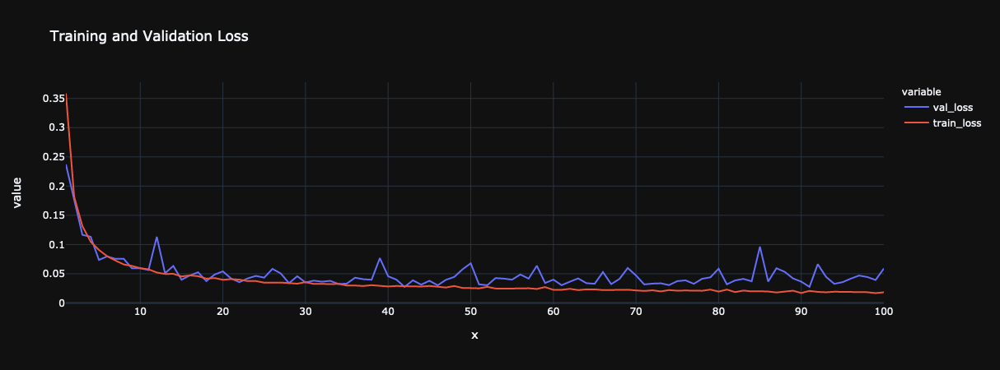

<Figure size 864x432 with 0 Axes>

In [119]:
plt.figure(figsize = (12, 6))

train_loss = model_history.history['loss']
val_loss = model_history.history['val_loss'] 
epoch = range(1, 101)

loss = pd.DataFrame({'train_loss' : train_loss, 'val_loss' : val_loss})

px.line(data_frame = loss, x = epoch, y = ['val_loss', 'train_loss'], title = 'Training and Validation Loss',
        template = 'plotly_dark')

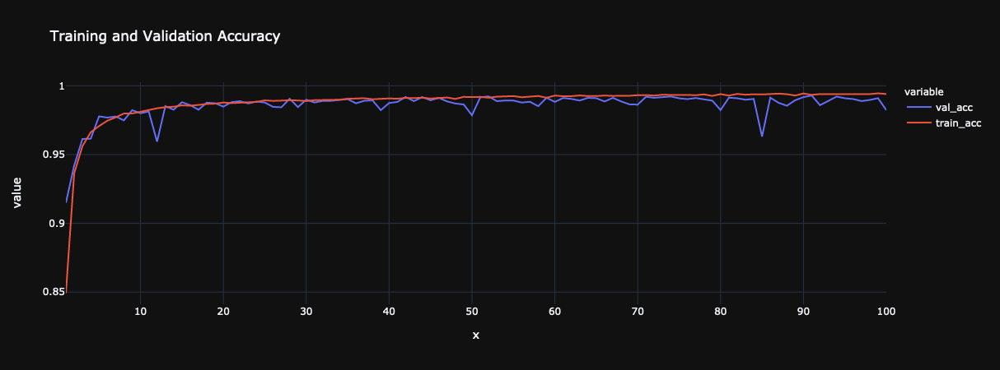

<Figure size 864x432 with 0 Axes>

In [120]:
plt.figure(figsize = (12, 6))

train_acc = model_history.history['accuracy']
val_acc = model_history.history['val_accuracy'] 
epoch = range(1, 101)


accuracy = pd.DataFrame({'train_acc' : train_acc, 'val_acc' : val_acc})

px.line(data_frame = accuracy, x = epoch, y = ['val_acc', 'train_acc'], title = 'Training and Validation Accuracy',
        template = 'plotly_dark')

In [121]:
acc_ann = model.evaluate(X_test, y_test)[1]
print(f'Accuracy of model is {acc_ann}')

1118/1118 [==============================] - 3s 3ms/step - loss: 0.0590 - accuracy: 0.9823
Accuracy of model is 0.9823281168937683


# Models Comparison

In [122]:
models = pd.DataFrame({
    'Model' : ['Logistic Regression', 'KNN', 'Decision Tree Classifier', 'Random Forest Classifier','Ada Boost Classifier',
             'Gradient Boosting Classifier', 'XgBoost', 'Cat Boost', 'Extra Trees Classifier', 'LGBM', 'Voting Classifier'
               , 'ANN'],
    'Score' : [acc_lr, acc_knn, acc_dtc, acc_rd_clf, acc_ada, acc_gb, acc_xgb, acc_cat, acc_etc, acc_lgbm, acc_vtc, acc_ann]
})


models.sort_values(by = 'Score', ascending = False)

,Model,Score
7,Cat Boost,0.995554
6,XgBoost,0.982971
11,ANN,0.982328
10,Voting Classifier,0.963454
9,LGBM,0.961021
3,Random Forest Classifier,0.953919
8,Extra Trees Classifier,0.952241
4,Ada Boost Classifier,0.941364
2,Decision Tree Classifier,0.941336
5,Gradient Boosting Classifier,0.916254


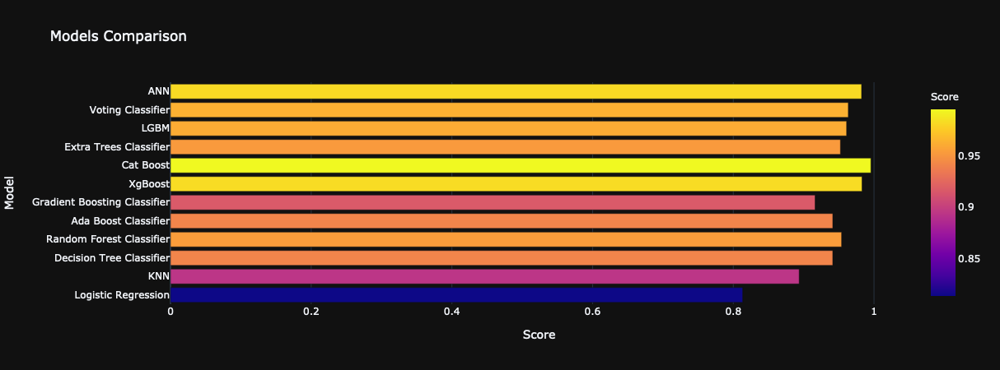

In [123]:
px.bar(data_frame = models, x = 'Score', y = 'Model', color = 'Score', template = 'plotly_dark', title = 'Models Comparison')

# Forecasting the hotels demand for the rest of 2017

In [125]:
# Seasonality decomposition
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.seasonal import seasonal_decompose # holt winters 
# single exponential smoothing
from statsmodels.tsa.holtwinters import SimpleExpSmoothing   # double and triple exponential smoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing

In [126]:
DirPath = "/Users/oozdal/Documents/GitHub/Dive-Into-Deep-Learning/Hotel_booking/"
df = pd.read_csv(DirPath + 'hotel_bookings.csv', header=0, sep=",")
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [127]:
# Let's convert months into numbers
converter = {'January': '01', 'February': '02', 'March': '03' , 'April': '04' , 'May': '05',
            'June': '06', 'July': '07','August': '08', 'September': '09', 'October': '10', 'November': '11', 'December': '12'}

df['arrival_date_month'] = df['arrival_date_month'].apply(lambda x: converter[x])
df['arrival_date_month']

0         07
1         07
2         07
3         07
4         07
          ..
119385    08
119386    08
119387    08
119388    08
119389    08
Name: arrival_date_month, Length: 119390, dtype: object

In [128]:
# Let's add a new column called arrival_date which has a proper ddate format
cols=["arrival_date_year","arrival_date_month","arrival_date_day_of_month"]
df['arrival_date'] = df[cols].apply(lambda x: '-'.join(x.values.astype(str)), axis="columns")
df['arrival_date']

0          2015-07-1
1          2015-07-1
2          2015-07-1
3          2015-07-1
4          2015-07-1
             ...    
119385    2017-08-30
119386    2017-08-31
119387    2017-08-31
119388    2017-08-31
119389    2017-08-29
Name: arrival_date, Length: 119390, dtype: object

In [129]:
# Let's create two dataframes. One for Resort Hotel and one for City Hotel
data_resort = df[(df['hotel'] == 'Resort Hotel') & (df['is_canceled'] == 0)]
data_city = df[(df['hotel'] == 'City Hotel') & (df['is_canceled'] == 0)]

In [130]:
# Let's see the number of guests in Resort Hotel
resort_guests = data_resort['arrival_date'].value_counts().reset_index()
resort_guests.columns=['arrival_date','no of guests']
resort_guests = resort_guests.set_index(pd.DatetimeIndex(resort_guests['arrival_date']))
resort_guests.drop(columns=['arrival_date'], inplace=True)
resort_guests

,no of guests
arrival_date,
2015-12-05,116
2017-01-16,114
2015-12-30,109
2017-03-02,104
2016-03-24,103
...,...
2015-12-13,9
2015-10-17,8
2015-11-14,8


In [131]:
# Let's see the number of guests in City Hotel
city_guests = data_city['arrival_date'].value_counts().reset_index()
city_guests.columns=['arrival_date','no of guests']
city_guests = city_guests.set_index(pd.DatetimeIndex(city_guests['arrival_date']))
city_guests.drop(columns=['arrival_date'], inplace=True)
city_guests

,no of guests
arrival_date,
2016-06-24,204
2016-06-06,162
2015-10-02,155
2016-05-26,153
2015-12-05,139
...,...
2015-07-16,1
2015-07-09,1
2015-07-02,1


In [132]:
# Let's sort the values by arrival date
resort_guests = resort_guests.sort_values(by="arrival_date")
city_guests   = city_guests.sort_values(by="arrival_date")

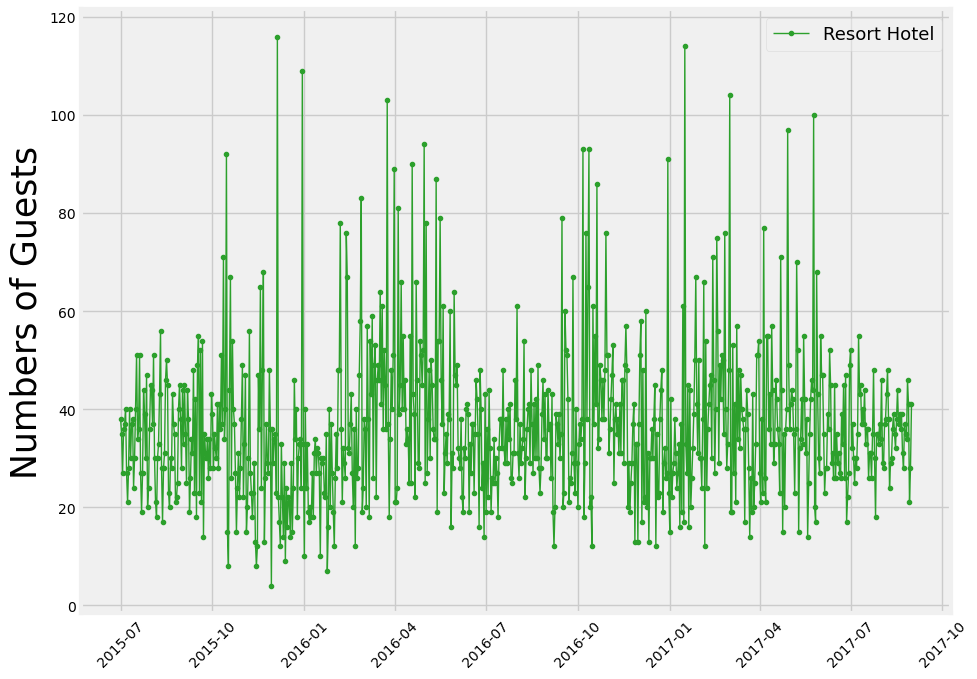

In [133]:
fig, ax1 = plt.subplots(figsize=(10, 8), dpi=100)
fig.set_facecolor('white')                                   
ax1.plot(resort_guests.index, np.array(resort_guests['no of guests']), c="tab:green", marker=".", zorder=50, lw = 1, label='Resort Hotel')    

plt.xticks(rotation = 45)
plt.ylabel("Numbers of Guests", fontsize=25)

leg = plt.legend(loc='best',fontsize=13,ncol=2)
leg.get_frame().set_alpha(0.5)

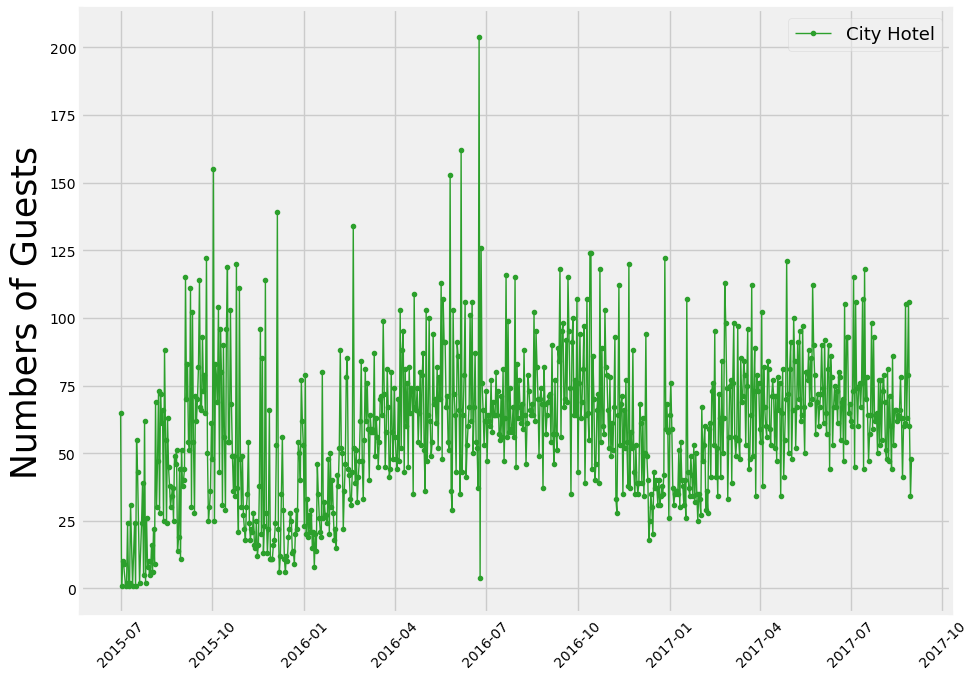

In [134]:
fig, ax1 = plt.subplots(figsize=(10, 8), dpi=100)
fig.set_facecolor('white')                                   
ax1.plot(city_guests.index, np.array(city_guests['no of guests']), c="tab:green", marker=".", zorder=50, lw = 1, label='City Hotel')    

plt.xticks(rotation = 45)
plt.ylabel("Numbers of Guests", fontsize=25)

leg = plt.legend(loc='best',fontsize=13,ncol=2)
leg.get_frame().set_alpha(0.5)

# Decomposing the Time Series

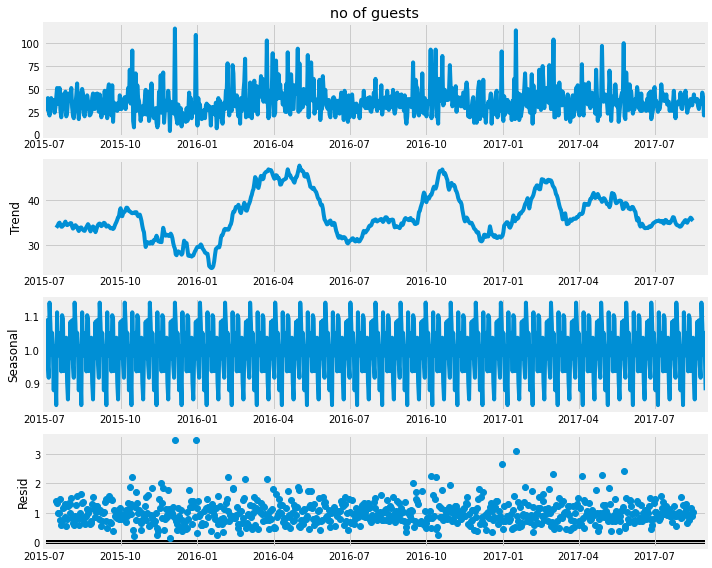

In [142]:
# Decomposing the Time Series to look for Levels, Trends and Seasonality in the "Resort Hotel Guests" data
plt.rcParams["figure.figsize"] = (10, 8)
decompose_result = seasonal_decompose(resort_guests['no of guests'], model='multiplicative', period=30)
decompose_result.plot();

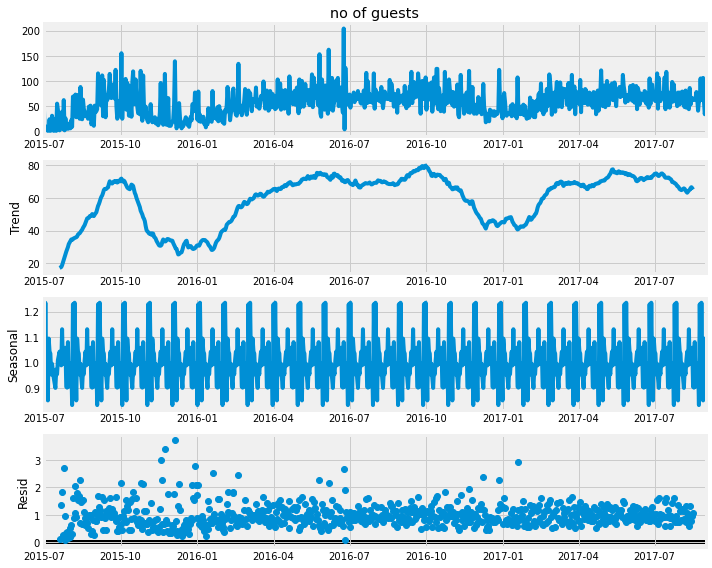

In [143]:
# Decomposing the Time Series to look for Levels, Trends and Seasonality in the "City Hotel Guests" data
decompose_result = seasonal_decompose(city_guests['no of guests'], model='multiplicative', period=30)
decompose_result.plot();

In [144]:
# Setting the frequency of the date time 
resort_guests.index.freq = 'd'

# Set the value of Alpha and define m (Time Period)
m = 30
alpha = 1/(2*m)

# Single HWES

Text(0, 0.5, 'Numbers of Guests')

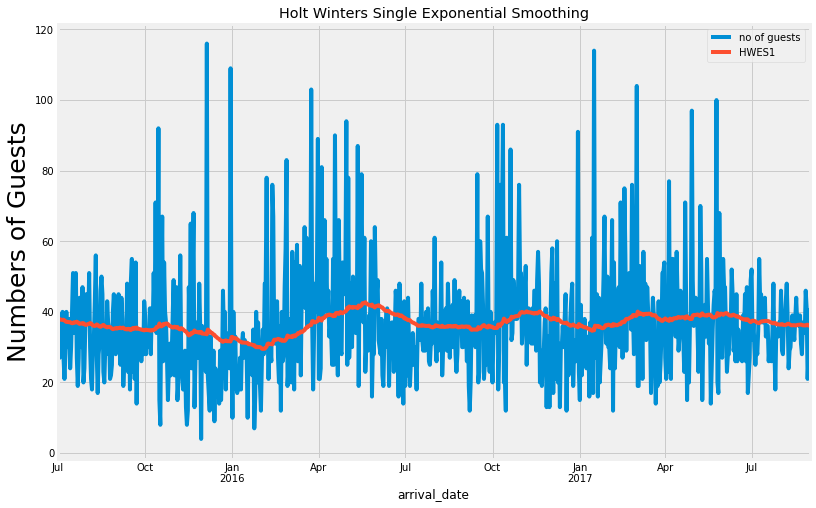

In [155]:
# We will fit the data on the Single Exponential Smoothing
resort_guests['HWES1'] = SimpleExpSmoothing(resort_guests['no of guests']).fit(smoothing_level=alpha, optimized=False,use_brute=True).fittedvalues
resort_guests[['no of guests','HWES1']].plot(title='Holt Winters Single Exponential Smoothing');
plt.ylabel("Numbers of Guests", fontsize=25)

# Double HWES

Text(0, 0.5, 'Numbers of Guests')

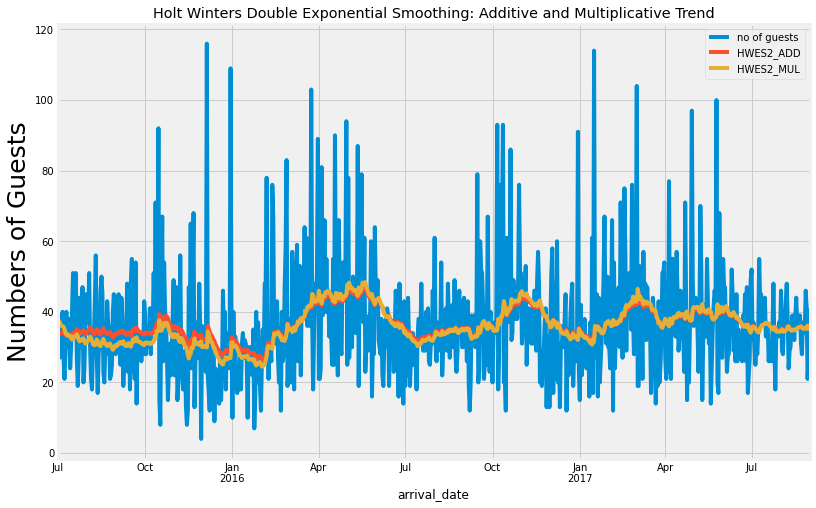

In [156]:
# We will fit the data on Double ES, on both Additive and Multiplicative Trend
resort_guests['HWES2_ADD'] = ExponentialSmoothing(resort_guests['no of guests'],trend='add').fit().fittedvalues
resort_guests['HWES2_MUL'] = ExponentialSmoothing(resort_guests['no of guests'],trend='mul').fit().fittedvalues
resort_guests[['no of guests','HWES2_ADD','HWES2_MUL']].plot(title='Holt Winters Double Exponential Smoothing: Additive and Multiplicative Trend');
plt.ylabel("Numbers of Guests", fontsize=25)

# Triple HWES

Text(0, 0.5, 'Numbers of Guests')

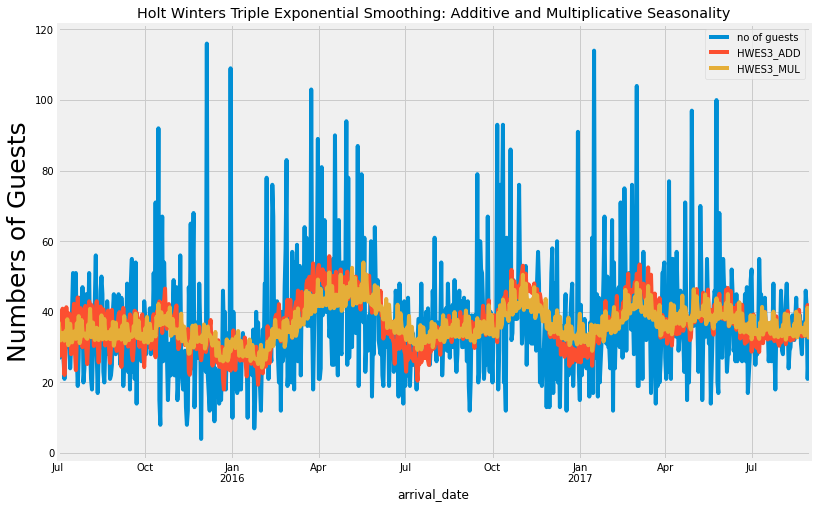

In [157]:
resort_guests['HWES3_ADD'] = ExponentialSmoothing(resort_guests['no of guests'],trend='add', seasonal='add', seasonal_periods=12).fit().fittedvalues
resort_guests['HWES3_MUL'] = ExponentialSmoothing(resort_guests['no of guests'],trend='mul', seasonal='mul', seasonal_periods=12).fit().fittedvalues
resort_guests[['no of guests','HWES3_ADD','HWES3_MUL']].plot(title='Holt Winters Triple Exponential Smoothing: Additive and Multiplicative Seasonality');
plt.ylabel("Numbers of Guests", fontsize=25)

# Forecasting with Holt-Winters Exponential Smoothing (Resort Hotel)

In [148]:
# Split into train and test set
train_resort_guests = resort_guests[:630]
test_resort_guests = resort_guests[630:]

Text(0, 0.5, 'Numbers of Guests')

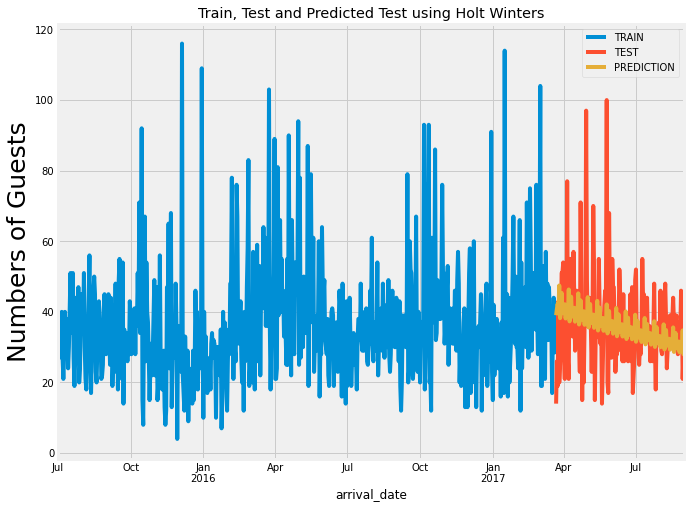

In [158]:
fitted_model = ExponentialSmoothing(train_resort_guests['no of guests'],trend='mul',seasonal='mul',seasonal_periods=12).fit()
test_predictions = fitted_model.forecast(len(test_resort_guests))

train_resort_guests['no of guests'].plot(legend=True,label='TRAIN')
test_resort_guests['no of guests'].plot(legend=True,label='TEST',figsize=(10,8))
test_predictions.plot(legend=True,label='PREDICTION')

plt.title('Train, Test and Predicted Test using Holt Winters')
plt.ylabel("Numbers of Guests", fontsize=25)

Text(0, 0.5, 'Numbers of Guests')

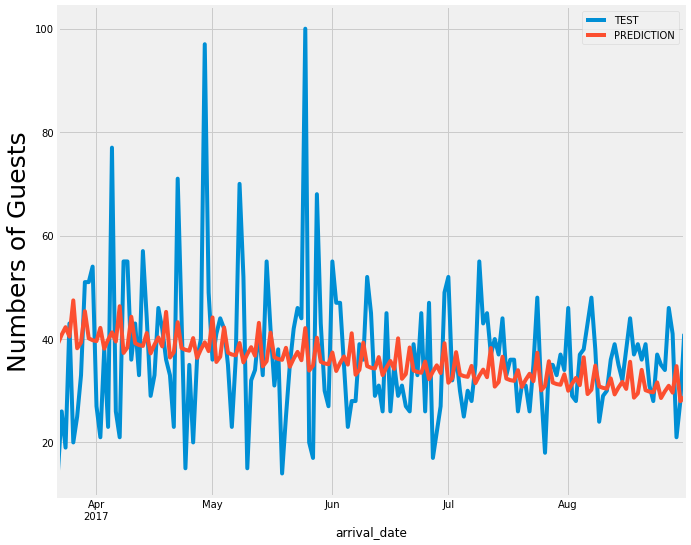

In [159]:
test_resort_guests['no of guests'].plot(legend=True,label='TEST',figsize=(10,9))
test_predictions.plot(legend=True,label='PREDICTION',xlim=['2017-03-22','2017-08-31']);
plt.ylabel("Numbers of Guests", fontsize=25)

# Evaluation Metrics

In [160]:
from sklearn.metrics import mean_absolute_error,mean_squared_error
print(f'Mean Absolute Error =  {mean_absolute_error(test_resort_guests["no of guests"], test_predictions)}')
print(f'Mean Squared Error = {mean_squared_error(test_resort_guests["no of guests"], test_predictions)}')

Mean Absolute Error =  9.43969013409286
Mean Squared Error = 170.20596681788876


# Number of Guests Per Month

In [163]:
# Number of Guests Per Month for Resort Hotel
numbers_resort = data_resort.groupby(by=[data_resort.arrival_date_year, data_resort.arrival_date_month])["arrival_date"].count()
numbers_resort

arrival_date_year  arrival_date_month
2015               07                    1058
                   08                    1043
                   09                    1034
                   10                    1160
                   11                     920
                   12                     961
2016               01                     765
                   02                    1113
                   03                    1409
                   04                    1345
                   05                    1323
                   06                     993
                   07                     985
                   08                    1107
                   09                    1068
                   10                    1417
                   11                    1056
                   12                    1056
2017               01                    1103
                   02                    1195
                   03                    1

In [164]:
# Number of Guests Per Month for City Hotel
numbers_city = data_city.groupby(by=[data_city.arrival_date_year, data_city.arrival_date_month])["arrival_date"].count()
numbers_city

arrival_date_year  arrival_date_month
2015               07                     459
                   08                    1248
                   09                    1986
                   10                    2065
                   11                     934
                   12                     986
2016               01                     926
                   02                    1441
                   03                    1938
                   04                    2022
                   05                    2240
                   06                    2203
                   07                    2088
                   08                    2131
                   09                    2304
                   10                    2272
                   11                    1762
                   12                    1406
2017               01                    1328
                   02                    1623
                   03                    2

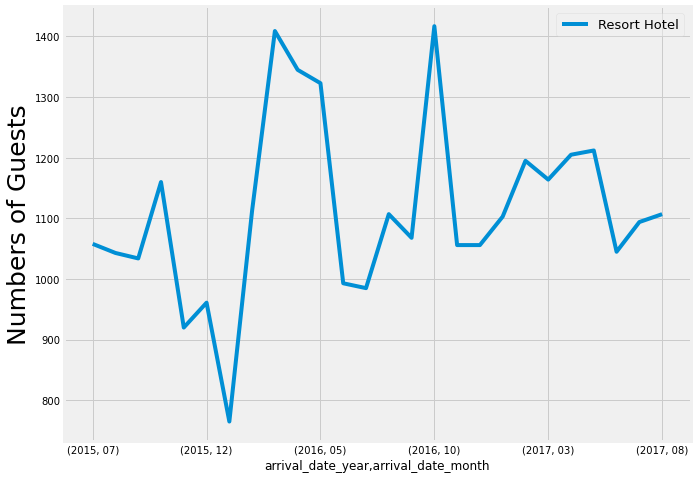

In [165]:
ax1 = numbers_resort.plot(figsize=(10, 8), label='Resort Hotel')
plt.ylabel("Numbers of Guests", fontsize=25)
leg = plt.legend(loc='best',fontsize=13,ncol=2)
leg.get_frame().set_alpha(0.5)

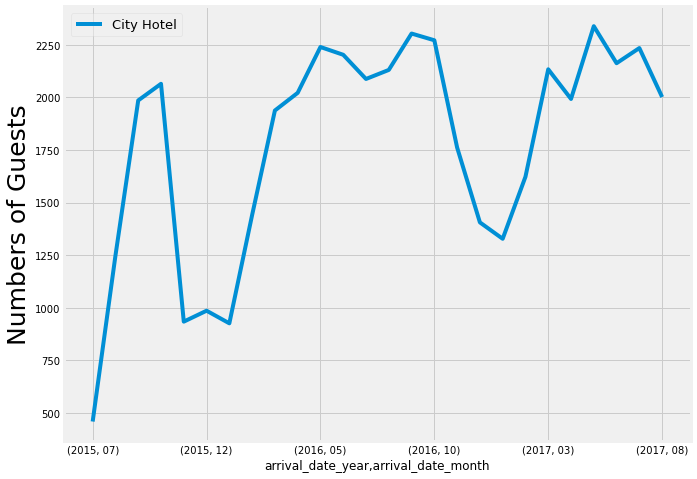

In [166]:
ax1 = numbers_city.plot(figsize=(10, 8), label='City Hotel')
plt.ylabel("Numbers of Guests", fontsize=25)
leg = plt.legend(loc='best',fontsize=13,ncol=2)
leg.get_frame().set_alpha(0.5)

In [167]:
# Convert numbers_resort to data frame
numbers_resort = numbers_resort.to_frame()
numbers_resort.index = ['{}-{}'.format(i, j) for i, j in numbers_resort.index]
numbers_resort.columns = ["no of guests"]
numbers_resort = numbers_resort.set_index(pd.DatetimeIndex(numbers_resort.index))

In [168]:
# Split into train and test set (Resort Hotel)
train_numbers_resort = numbers_resort[:18]
test_numbers_resort = numbers_resort[17:]

Text(0.5, 1.0, 'Train, Test and Predicted Test using Holt Winters')

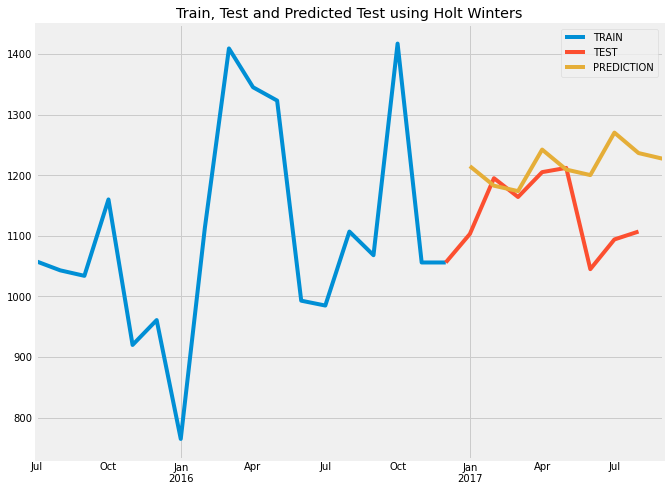

In [170]:
fitted_model = ExponentialSmoothing(train_numbers_resort['no of guests'],trend='mul',seasonal='mul',seasonal_periods=3).fit()
test_predictions = fitted_model.forecast(len(test_numbers_resort))

train_numbers_resort['no of guests'].plot(legend=True,label='TRAIN')
test_numbers_resort['no of guests'].plot(legend=True,label='TEST',figsize=(10,8))
test_predictions.plot(legend=True,label='PREDICTION')

plt.title('Train, Test and Predicted Test using Holt Winters')

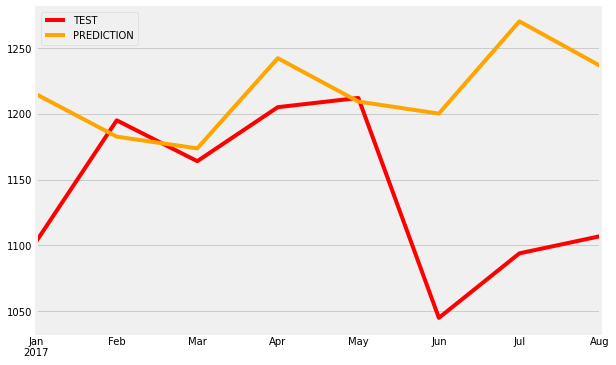

In [172]:
test_numbers_resort['no of guests'].plot(legend=True,label='TEST',figsize=(9,6), color="red")
test_predictions.plot(legend=True,label='PREDICTION',xlim=['2017-01-01','2017-08-31'], color="orange");

In [173]:
print(f'Mean Absolute Error =  {mean_absolute_error(test_numbers_resort["no of guests"], test_predictions)}')
print(f'Mean Squared Error = {mean_squared_error(test_numbers_resort["no of guests"], test_predictions)}')

Mean Absolute Error =  93.5407004977102
Mean Squared Error = 13748.15100704966


In [174]:
# Convert numbers_city to data frame
numbers_city = numbers_city.to_frame()
numbers_city.index = ['{}-{}'.format(i, j) for i, j in numbers_city.index]
numbers_city.columns = ["no of guests"]
numbers_city = numbers_city.set_index(pd.DatetimeIndex(numbers_city.index))

In [175]:
# Split into train and test set (City Hotel)
train_numbers_city = numbers_city[:18]
test_numbers_city = numbers_city[17:]

Text(0.5, 1.0, 'Train, Test and Predicted Test using Holt Winters')

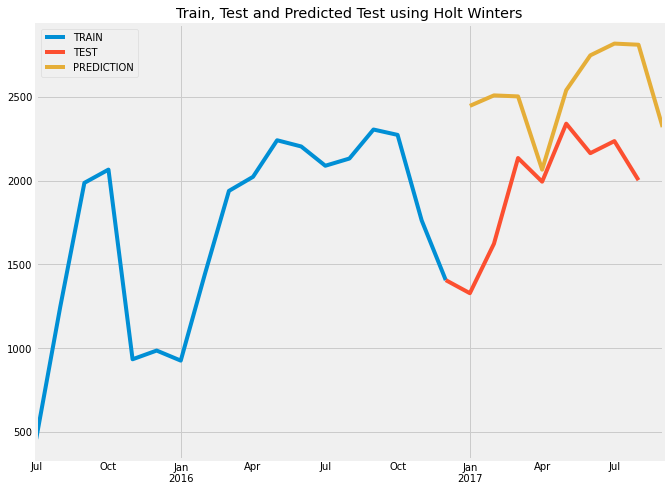

In [177]:
fitted_model = ExponentialSmoothing(train_numbers_city['no of guests'],trend='mul',seasonal='mul',seasonal_periods=5).fit()
test_predictions = fitted_model.forecast(len(test_numbers_city))

train_numbers_city['no of guests'].plot(legend=True,label='TRAIN')
test_numbers_city['no of guests'].plot(legend=True,label='TEST',figsize=(10,8))
test_predictions.plot(legend=True,label='PREDICTION')

plt.title('Train, Test and Predicted Test using Holt Winters')

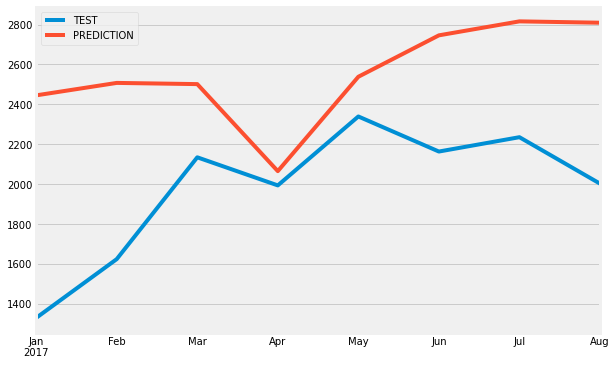

In [178]:
test_numbers_city['no of guests'].plot(legend=True,label='TEST',figsize=(9,6))
test_predictions.plot(legend=True,label='PREDICTION',xlim=['2017-01-01','2017-08-31']);

In [179]:
print(f'Mean Absolute Error =  {mean_absolute_error(test_numbers_city["no of guests"], test_predictions)}')
print(f'Mean Squared Error = {mean_squared_error(test_numbers_city["no of guests"], test_predictions)}')

Mean Absolute Error =  629.3509172758814
Mean Squared Error = 507602.73996076494
